In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.decomposition import PCA
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_predict
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_validate
from sklearn.model_selection import learning_curve

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd

import lightgbm as lgb

from sklearn.ensemble import AdaBoostClassifier



Reading the train and test csv files.

In [5]:
train_df = pd.read_csv('/Users/theob/Desktop/DSBA ESSEC CENTRAL/Cours/Courses/Foundation of Machine Learning (FLM)/Homework/Ass2/Git-Code/Credit-Score-Classification/data/train_set.csv', index_col= 0)
test_df = pd.read_csv('/Users/theob/Desktop/DSBA ESSEC CENTRAL/Cours/Courses/Foundation of Machine Learning (FLM)/Homework/Ass2/Git-Code/Credit-Score-Classification/data/test_set.csv', index_col= 0)

In [6]:
numerical_columns = ['Age',
                            'Num_Bank_Accounts',
                            'Num_Credit_Card',
                            'Interest_Rate',
                            'Num_of_Loan',
                            'Delay_from_due_date',
                            'Num_of_Delayed_Payment',
                            'Num_Credit_Inquiries',
                            'Credit_History_Age',
                            'Credit_Utilization_Ratio',
                           'Annual_Income',
                           'Monthly_Inhand_Salary', 
                           'Changed_Credit_Limit', 
                           'Outstanding_Debt', 
                           'Total_EMI_per_month',
                           'Amount_invested_monthly', 
                           'Monthly_Balance']

# EDA

In [7]:
num_rows, num_cols = train_df.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 70000
Number of columns: 27


In [8]:
train_df.dtypes

Customer_ID                   int64
Month                         int64
Name                         object
Age                         float64
SSN                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Type_of_Loan                 object
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                 object
dtype: object

In [9]:
train_df.isnull().sum()

Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [10]:
train_df.describe()

,Customer_ID,Month,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,70000.000000,70000.000000,70000.00000,7.000000e+04,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,25950.636700,4.497343,33.27990,5.003604e+08,50480.160439,4195.830734,5.369971,5.536771,14.552471,3.531986,21.059857,13.300557,10.490027,5.802886,1426.611851,32.285372,221.020214,107.425309,55.120294,392.625242
std,14350.337976,2.286472,10.77359,2.911527e+08,38375.554706,3192.774574,2.595301,2.067419,8.749310,2.447495,14.815379,6.230288,6.609701,3.867851,1155.679875,5.114936,99.526463,130.888479,39.045155,202.251999
min,1006.000000,1.000000,14.00000,8.134900e+04,7005.930000,303.645417,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.230000,20.000000,1.000000,0.000000,0.000000,0.007760
25%,13616.000000,3.000000,24.00000,2.443929e+08,19287.516250,1622.209167,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,5.400000,3.000000,568.590000,28.028629,144.000000,29.294017,28.027069,267.391375
50%,25709.500000,4.000000,33.00000,5.000637e+08,36938.820000,3081.902500,6.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.410000,5.000000,1164.700000,32.330840,219.000000,66.378401,45.127125,333.179018
75%,38414.000000,6.000000,42.00000,7.560027e+08,71678.542500,5967.930000,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.900000,9.000000,1945.190000,36.485926,301.000000,147.220773,71.175522,463.411588
max,50999.000000,8.000000,56.00000,9.999934e+08,179987.280000,15204.633333,11.000000,11.000000,34.000000,9.000000,62.000000,25.000000,29.980000,17.000000,4998.070000,50.000000,404.000000,1779.103254,434.191089,1183.930696


In [11]:
train_df.head()

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
ID,,,,,,,,,,,,,,,,,,,,,
84094,23943,5,Leonoray,18.0,84355102.0,Journalist,70260.20,5564.016667,9.0,7.0,...,Bad,2228.79,25.308445,217.0,Yes,246.378645,99.939577,Low_spent_Small_value_payments,78.800397,Poor
46702,29066,5,Osamua,21.0,981149909.0,Teacher,18001.59,1258.132500,7.0,9.0,...,Bad,2225.58,32.088726,240.0,NM,24.986447,45.523998,Low_spent_Small_value_payments,343.581411,Poor
147514,8183,5,Benf,47.0,324295086.0,Developer,9824.31,707.692500,7.0,4.0,...,Standard,1233.96,25.500503,227.0,No,0.000000,22.006889,Low_spent_Medium_value_payments,322.170689,Good
16675,27938,2,Matt Falloonm,41.0,564682345.0,Entrepreneur,87481.62,7022.135000,0.0,4.0,...,Good,214.43,38.505066,282.0,No,55.653369,56.550721,High_spent_Medium_value_payments,726.849284,Standard
84080,38740,3,Seetharamank,53.0,228116416.0,Manager,129204.92,10508.076667,5.0,6.0,...,Standard,1075.37,38.359175,289.0,Yes,277.610885,165.019535,High_spent_Large_value_payments,742.018547,Standard


In [12]:
train_df.describe(include='object')

,Name,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
count,70000,70000,70000,70000,70000,70000,70000
unique,10127,15,6261,3,3,6,3
top,Stevex,Lawyer,No Data,Standard,Yes,Low_spent_Small_value_payments,Standard
freq,36,4887,7945,32091,36688,20075,37080


# Data Analysis

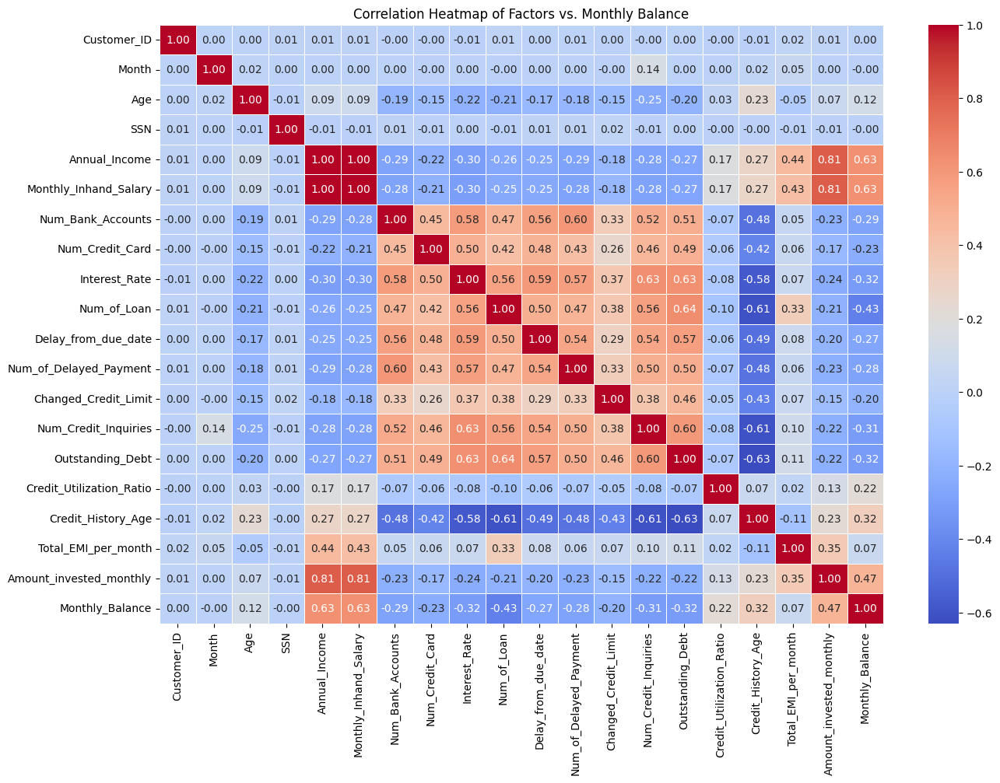

In [13]:
selected_columns = train_df.select_dtypes(include=['number'])

correlation_matrix = selected_columns.corr()


plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Factors vs. Monthly Balance')
plt.show()

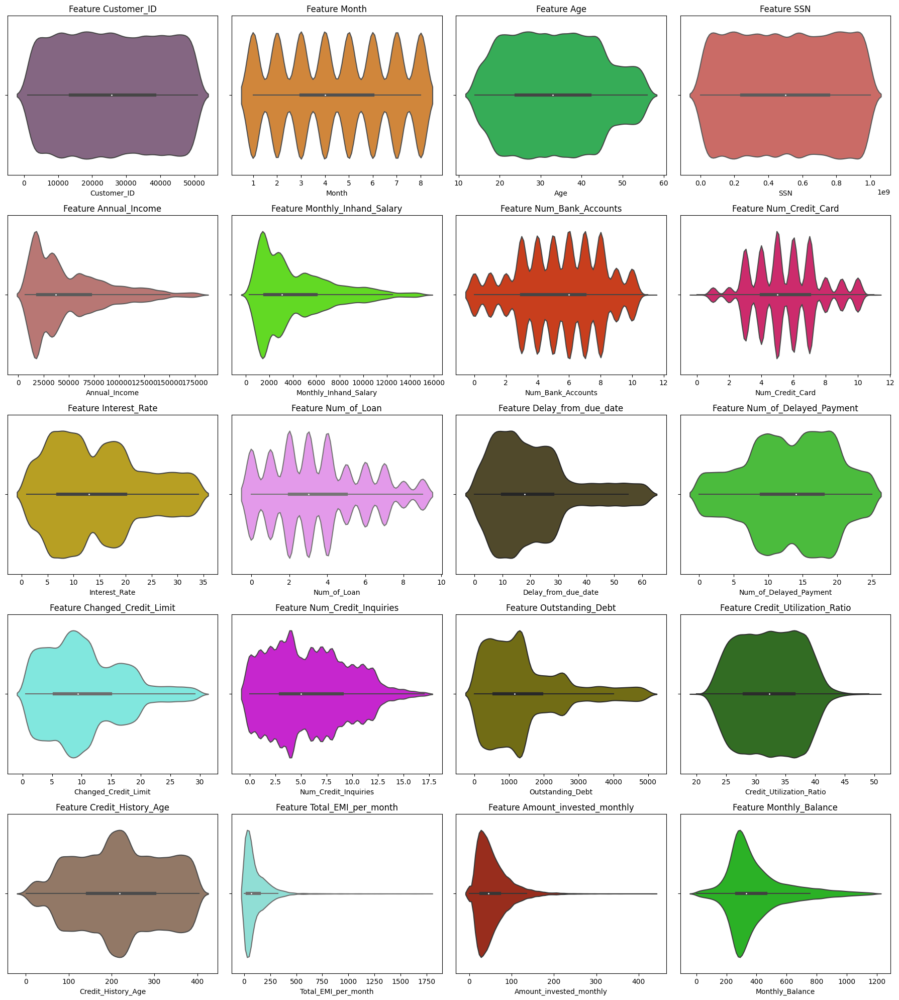

In [14]:
import numpy as np


num_vars = train_df.select_dtypes(include=['number'])

num_features = len(num_vars.columns)
num_rows = (num_features - 1) // 4 + 1

fig, axes = plt.subplots(num_rows, 4, figsize=(18, 4 * num_rows), sharey=True)

axes = axes.flatten()

for i, feature in enumerate(num_vars.columns):
    sns.violinplot(x=train_df[feature], ax=axes[i], color=np.random.rand(3,))
    axes[i].set_title(f'Feature {feature}')

# Hide unused subplots
for j in range(num_features, num_rows * 4):
    fig.delaxes(axes[j])


plt.tight_layout()

plt.show()

/var/folders/dj/drqjc_c134xgs5ns31syhsm40000gn/T/ipykernel_8965/3276623729.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(good[col], label='Good')
/var/folders/dj/drqjc_c134xgs5ns31syhsm40000gn/T/ipykernel_8965/3276623729.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(poor[col], label=

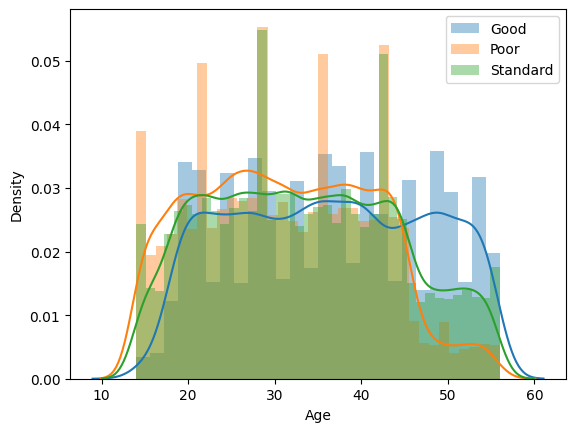

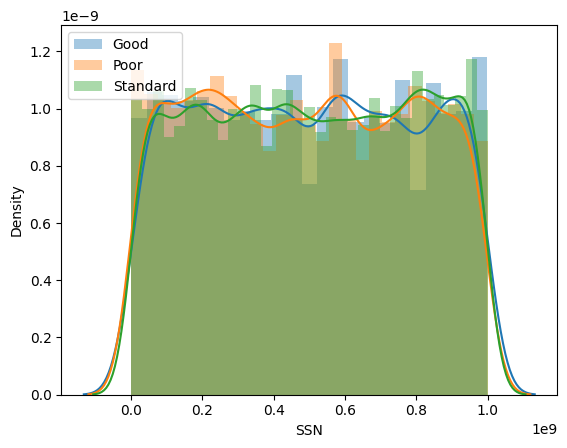

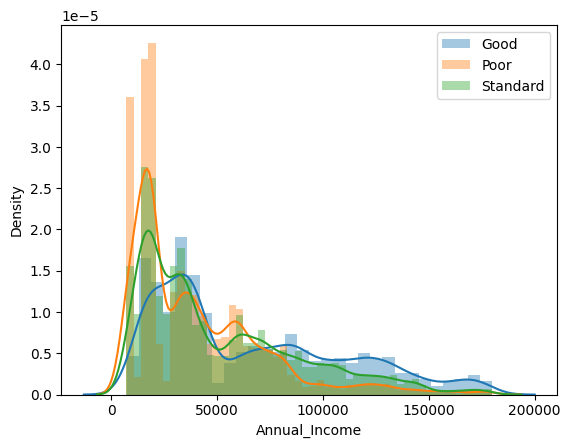

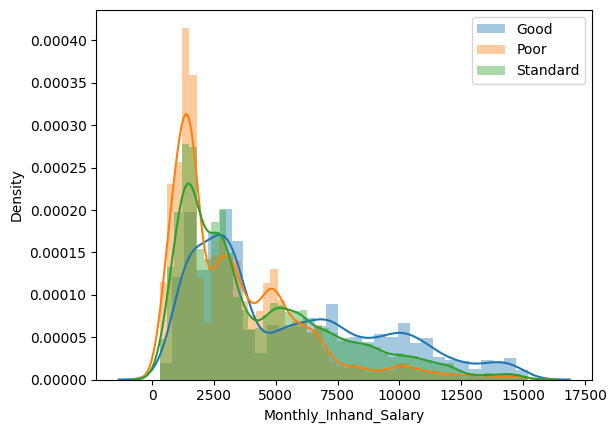

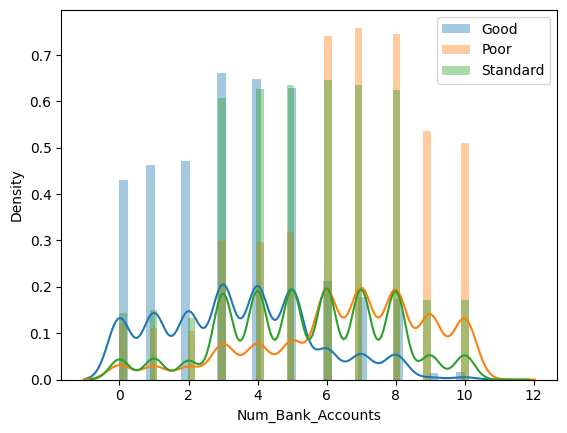

...

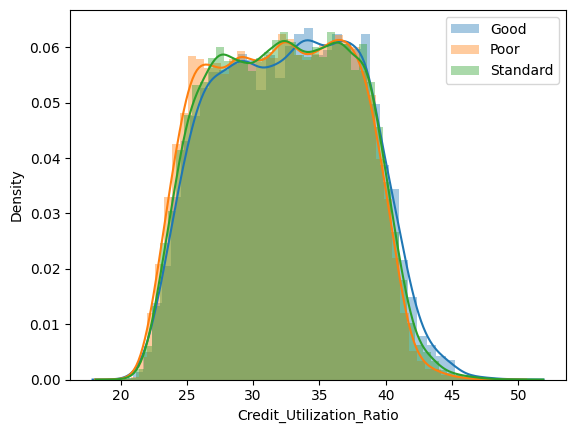

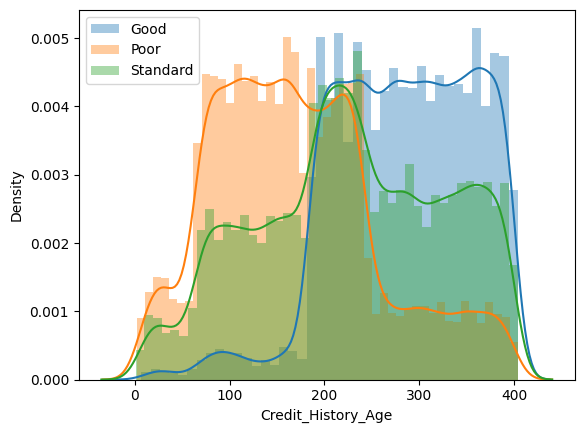

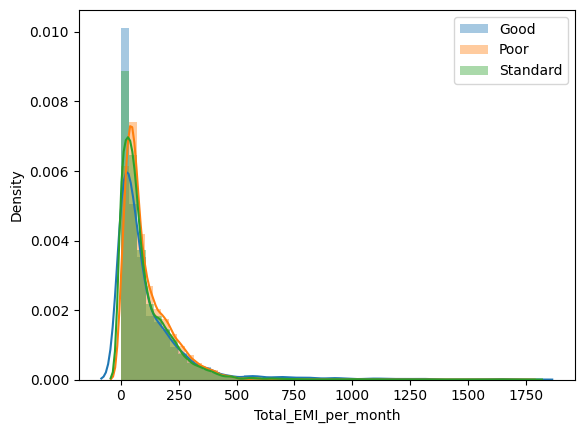

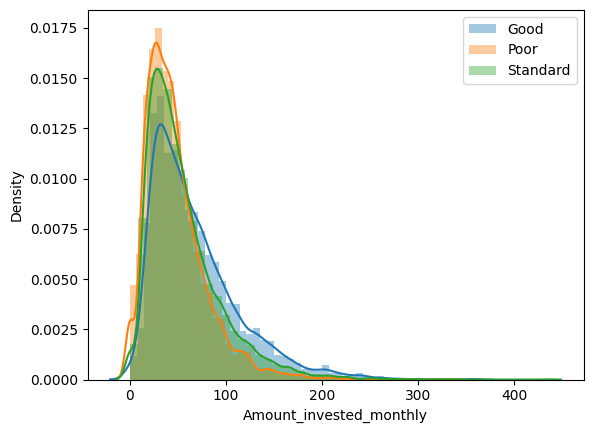

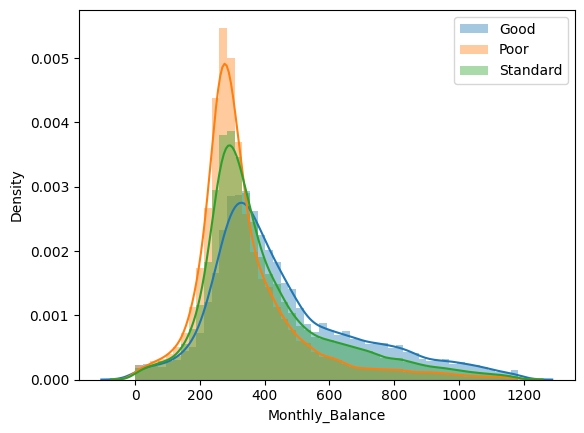

In [15]:
good = train_df[train_df['Credit_Score'] == 'Good']
standard = train_df[train_df['Credit_Score'] == 'Standard']
poor = train_df[train_df['Credit_Score'] == 'Poor']

for col in train_df.select_dtypes('float'):
    plt.figure()
    sns.distplot(good[col], label='Good')
    sns.distplot(poor[col], label='Poor')
    sns.distplot(standard[col], label='Standard')
    plt.legend()

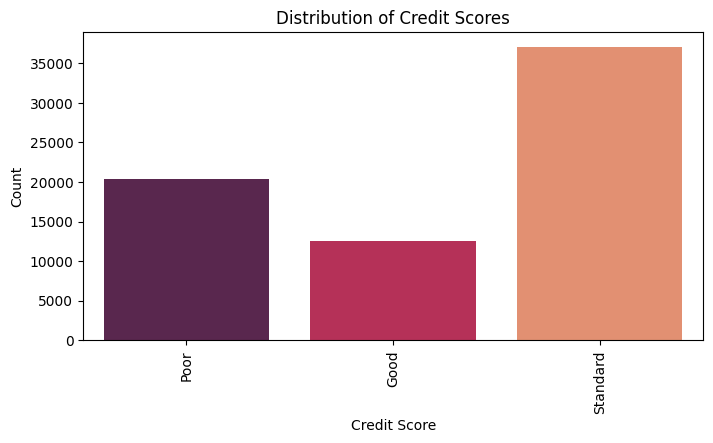

In [16]:
plt.figure(figsize=(8, 4))
sns.countplot(data=train_df, x='Credit_Score', palette='rocket')
plt.xlabel('Credit Score')
plt.ylabel('Count')
plt.title('Distribution of Credit Scores')
plt.xticks(rotation=90)
plt.show()

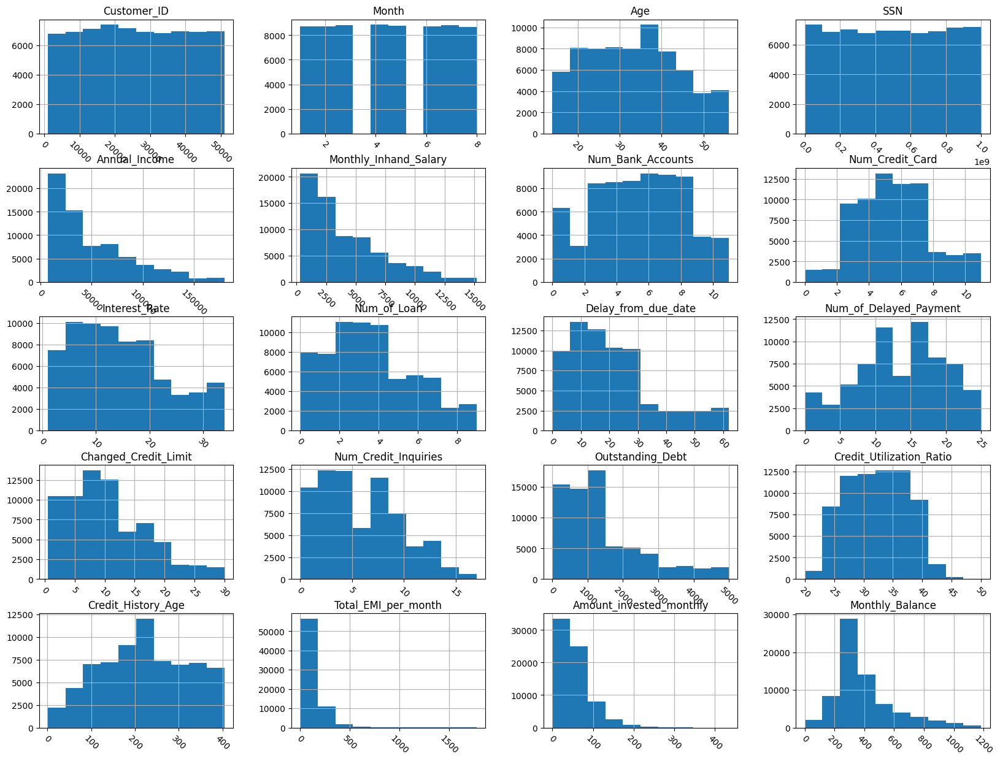

In [17]:
train_df.hist(figsize=(20,15), xrot=-45)
plt.show()

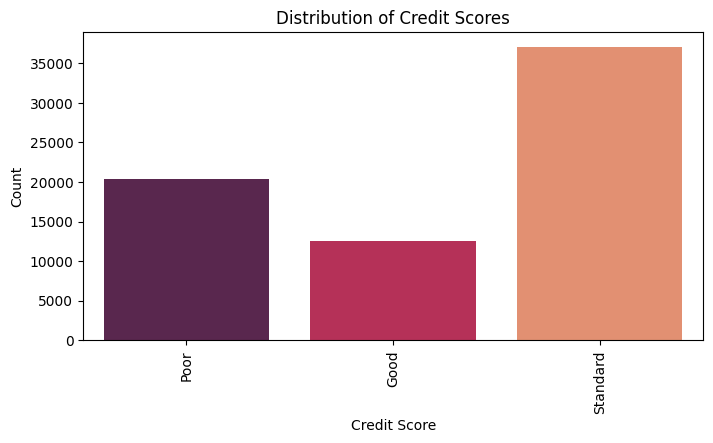

In [18]:
plt.figure(figsize=(8, 4))
sns.countplot(data=train_df, x='Credit_Score', palette='rocket')
plt.xlabel('Credit Score')
plt.ylabel('Count')
plt.title('Distribution of Credit Scores')
plt.xticks(rotation=90)
plt.show()

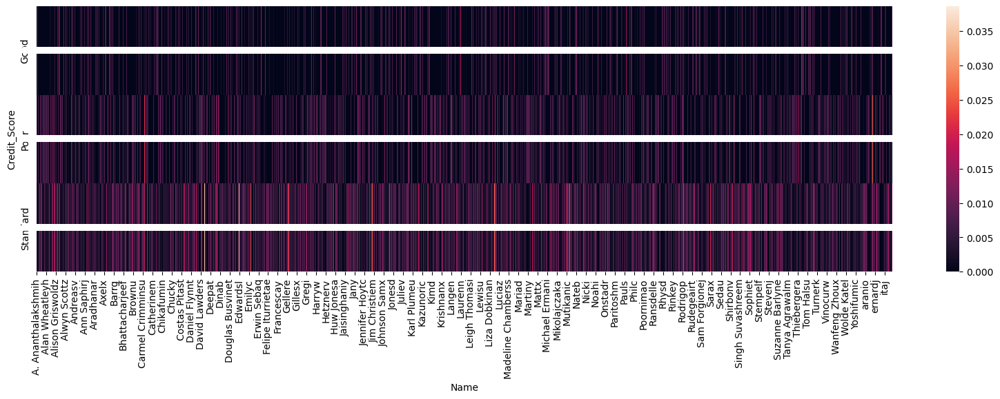

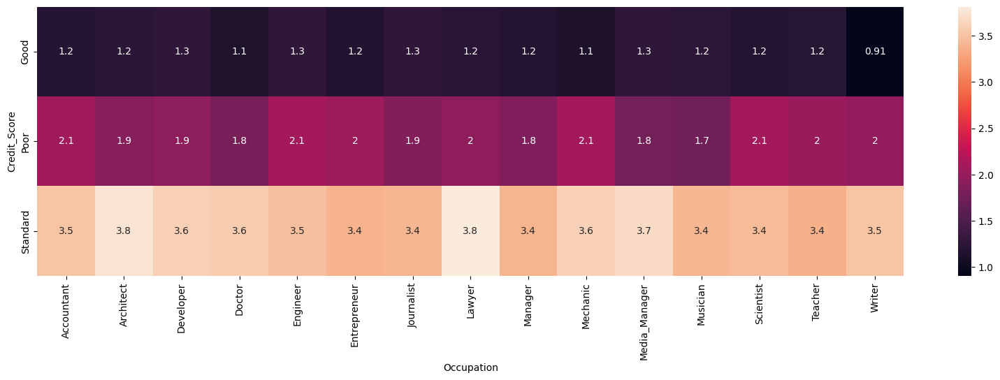

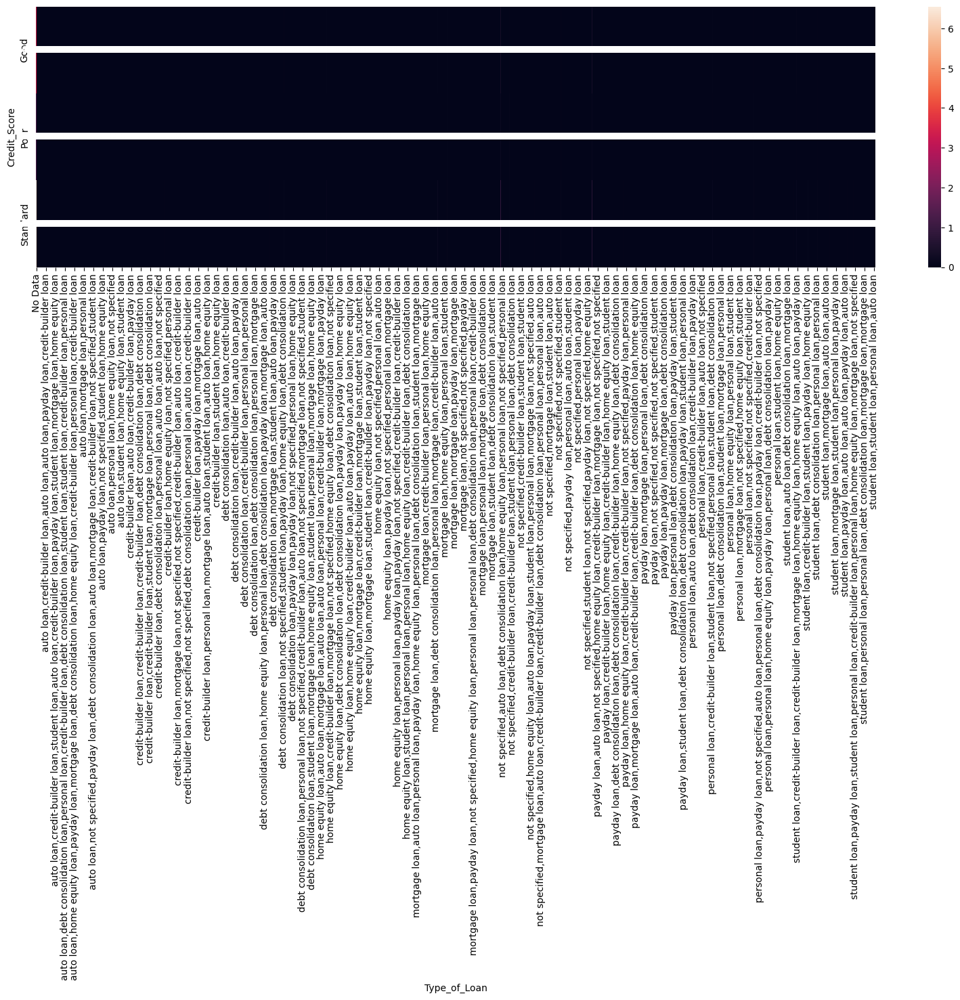

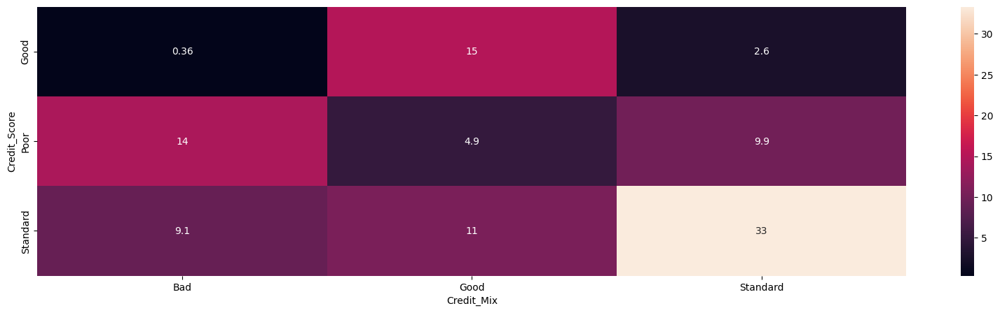

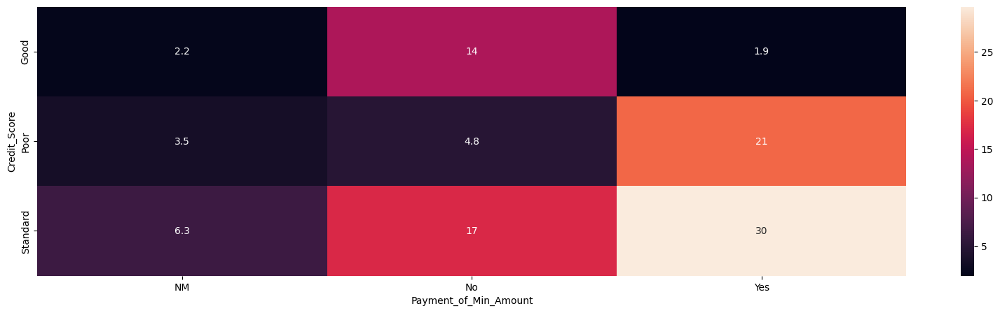

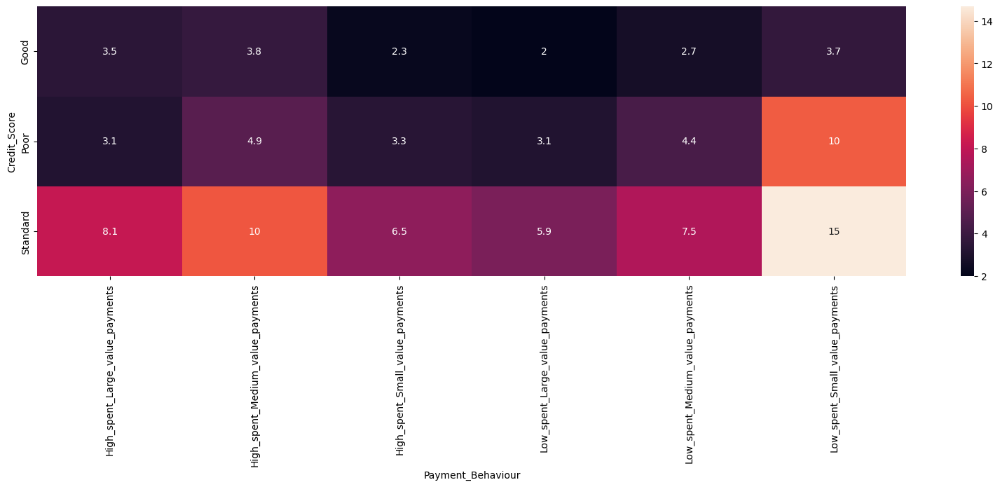

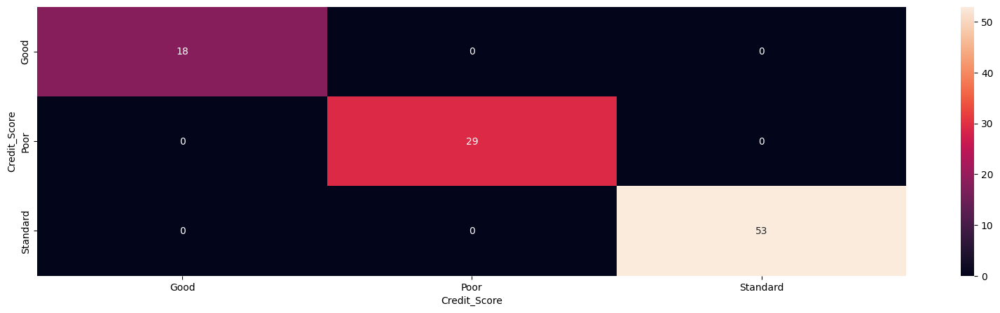

In [19]:
for col in train_df.select_dtypes('object'):
    plt.figure(figsize=(20,5))
    sns.heatmap( pd.crosstab(train_df['Credit_Score'], train_df[col], normalize=True) * 100, annot=True)

/Users/theob/Library/Python/3.9/lib/python/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


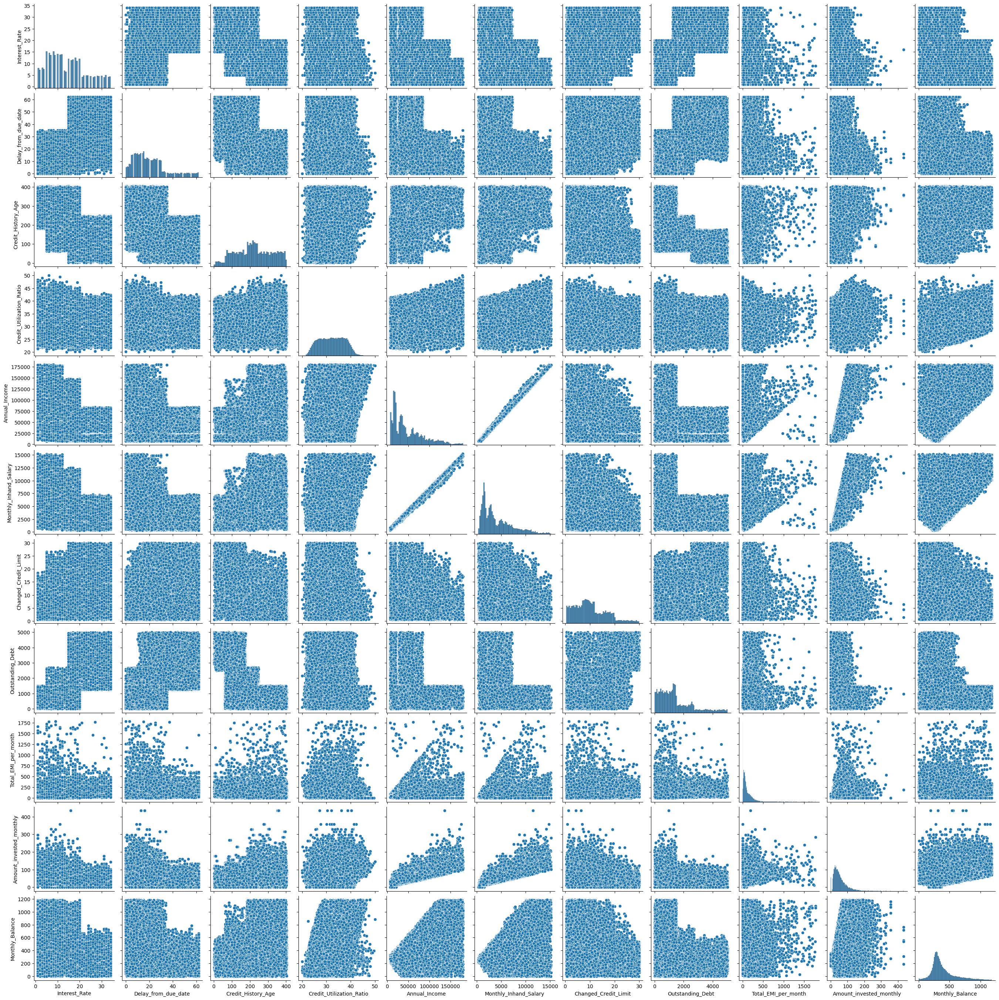

In [20]:
true_numerical_columns = ['Interest_Rate',
                            'Delay_from_due_date',
                            'Credit_History_Age',
                            'Credit_Utilization_Ratio',
                           'Annual_Income',
                           'Monthly_Inhand_Salary', 
                           'Changed_Credit_Limit', 
                           'Outstanding_Debt', 
                           'Total_EMI_per_month',
                           'Amount_invested_monthly', 
                           'Monthly_Balance']
sns.pairplot(train_df[true_numerical_columns])

### Test of H0
H0 = Interest_Rate, Delay_from_Due_Date, Delayed_Paiement, Outstanding_Debt, Credit_History are EQUAL NO MATTER THE CREDIT SCORE 

Goal = Reject this hypothesis

In [21]:
from scipy.stats import ttest_ind
# We must have balanced class between Credit Score

good = train_df[train_df['Credit_Score'] == 'Good']
standard = train_df[train_df['Credit_Score'] == 'Standard']
poor = train_df[train_df['Credit_Score'] == 'Poor']
min_value = min(good.shape[0], standard.shape[0], poor.shape[0])
good_sample = good.sample(min_value)
poor_sample = poor.sample(min_value)
standard_sample = standard.sample(min_value)

In [22]:
def t_test(col, sample1, sample2):
    alpha = 0.02
    stat, p = ttest_ind(sample1[col], sample2[col])
    if p < alpha:
        return 'H0 is rejected'
    else:
        return 0

In [23]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, good_sample, poor_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ H0 is rejected
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_inv

In [24]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, good_sample, standard_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ H0 is rejected
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_inv

In [25]:
for col in numerical_columns:
    print(f'{col :-<50} {t_test(col, standard_sample, poor_sample)}')

Age----------------------------------------------- H0 is rejected
Num_Bank_Accounts--------------------------------- H0 is rejected
Num_Credit_Card----------------------------------- H0 is rejected
Interest_Rate------------------------------------- H0 is rejected
Num_of_Loan--------------------------------------- H0 is rejected
Delay_from_due_date------------------------------- H0 is rejected
Num_of_Delayed_Payment---------------------------- H0 is rejected
Num_Credit_Inquiries------------------------------ H0 is rejected
Credit_History_Age-------------------------------- H0 is rejected
Credit_Utilization_Ratio-------------------------- H0 is rejected
Annual_Income------------------------------------- H0 is rejected
Monthly_Inhand_Salary----------------------------- H0 is rejected
Changed_Credit_Limit------------------------------ 0
Outstanding_Debt---------------------------------- H0 is rejected
Total_EMI_per_month------------------------------- H0 is rejected
Amount_invested_monthly

# Test of Baseline Models

In [26]:
#FIT NORMAL MODEL TO GET FEATURE IMPORTANCE
X_train = train_df.drop(columns=[ 'Customer_ID', "Name", 'SSN', 'Credit_Score', 'Type_of_Loan'])
y_train = train_df['Credit_Score']
label_encoder = LabelEncoder()
feature_encoder = OrdinalEncoder()

#ENCODE 
y_train = label_encoder.fit_transform(y_train).astype(int)
X_train[['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']] = feature_encoder.fit_transform(X_train[['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour']])

In [29]:
#TO BE RUN AGAIN WITH MORE MODELS



perf_models = {}
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)

kneighbors = KNeighborsClassifier()
kneighbors.fit(X_train, y_train)
perf_models['K-Neighbors'] = cross_val_score(kneighbors, X_train, y_train, cv=kfold).mean()

GradientBoosting = GradientBoostingClassifier()
GradientBoosting.fit(X_train, y_train)
perf_models['GradientBoosting'] = cross_val_score(GradientBoosting, X_train, y_train, cv=kfold).mean()


Adaboost = AdaBoostClassifier()
Adaboost.fit(X_train, y_train)
perf_models['Adaboost'] = cross_val_score(Adaboost, X_train, y_train, cv=kfold).mean()


Random_Forest = RandomForestClassifier()
Random_Forest.fit(X_train, y_train)
perf_models['Random_Forest'] = cross_val_score(Random_Forest, X_train, y_train, cv=kfold).mean()


Decision_Tree = DecisionTreeClassifier()
Decision_Tree.fit(X_train, y_train)
perf_models['Decision_Tree'] = cross_val_score(Decision_Tree, X_train, y_train, cv=kfold).mean()


lgb = lgb.LGBMClassifier(random_state= 0,objective= 'multiclass', class_weight = 'balanced', n_jobs = -1)
perf_models['lgb'] = cross_val_score(lgb, X_train, y_train, cv=kfold).mean()

models = pd.DataFrame(list(perf_models.items()), columns=['Model', 'Test Score'])

# Sort the DataFrame by 'Training Score' column in descending order
models = models.sort_values(by='Test Score', ascending=False)
models

/Users/theob/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/theob/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_scorer.py", line 140, in __call__
    score = scorer(estimator, *args, **routed_params.get(name).score)
  File "/Users/theob/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_scorer.py", line 527, in __call__
    return estimator.score(*args, **kwargs)
  File "/Users/theob/Library/Python/3.9/lib/python/site-packages/sklearn/base.py", line 705, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/Users/theob/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_classification.py", line 246, in predict
    if self._fit_method == "brute" and ArgKminClassMode.is_usable_for(
  File "/Users/theob/Libra

KeyboardInterrupt: 

Here we see that our two best models were Random Forest and LightGBM, so we decide to focus on these two

# Feature Engineering

First, we encode our categorical variables, and try out creating multiple new features


In [ ]:
def one_hot_encoding_loan_type(df):

        loan_types = df['Type_of_Loan'].str.split(',', expand=True)

        # Get all unique loan types
        unique_loan_types = loan_types.stack().unique()

        # Create a new DataFrame to store loan type counts
        loan_counts = pd.DataFrame(index=df.index)

        # Iterate over unique loan types and count occurrences
        for loan_type in unique_loan_types:
            loan_counts[loan_type] = loan_types.apply(lambda row: row.str.contains(loan_type).sum(), axis=1)

        # Display the DataFrame with loan type counts
        loan_counts = pd.DataFrame(loan_counts)

        df = pd.concat([df, loan_counts], axis=1)
        df = df.drop(columns=['No Data', 'not specified'])
        return df

train = one_hot_encoding_loan_type(train_df)
test = one_hot_encoding_loan_type(test_df)

Training Score : 0.9999857142857143
These are the cross validation scores for 0.8143285714285714


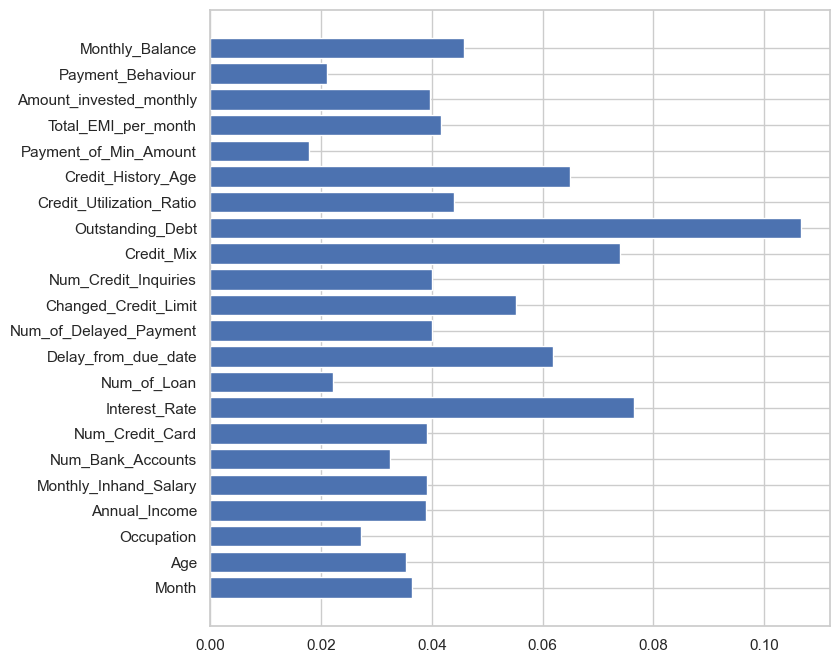

In [ ]:
#CHECK FEATURE IMPORTANCE, keeping all features with a baseline Random Forest model
RF = RandomForestClassifier(random_state=0)
RF.fit(X_train, y_train)
y_train_pred = RF.predict(X_train)
print(f'Training Score : {accuracy_score(y_train_pred, y_train)}')

#Here we run a cross validation keeping stratification of our categories, on 5 different folds
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest{scores.mean()}')

lgb = lgb.LGBMClassifier(random_state= 0,objective= 'multiclass', class_weight = 'balanced', n_jobs = -1)
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(lgb, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for LightGBM{scores.mean()}')


plt.figure(figsize=(8, 8))
plt.barh(X_train.columns, RF.feature_importances_)

plt.show()

With our baseline model, we had 81.43%. We will add new features and see if we can improve the accuracy. We also saw that we had almost 100% of accuracy on our train dataset which could mean overfitting. We plot a learning curve to check that.

In [28]:
RF= RandomForestClassifier(random_state= 0)
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)

def evaluation(model):
    
    N, train_score, val_score = learning_curve(model, X_train, y_train,
                                              cv=kfold, scoring='accuracy',
                                               train_sizes=np.linspace(0.1, 1, 10))
    
    
    plt.figure(figsize=(12, 8))
    plt.plot(N, train_score.mean(axis=1), label='train score')
    plt.plot(N, val_score.mean(axis=1), label='validation score')
    plt.legend()

evaluation(RF)

KeyboardInterrupt: 

Looking at the learning curve, we see that our training accuracy is really constant, while our testing accuracy increases as the training set gets bigger. Therefore, we eliminate the hypothesis of overfitting. 

In [ ]:
def avg_credit_score_features(train, test):
    # Create new columns for all the credit score that have been recorded for a specific customer up unitl now
    cr_score_df_train = train[['Customer_ID', 'Month', 'Credit_Score']].copy()
    cr_score_df_test = test[['Customer_ID', 'Month']].copy()
    # Add new columns for each months credit score
    cr_score_df_train['Credit_Score_avg'] = 1

    cr_score_df_test['Credit_Score_avg'] = 1

    # Iterate over each customer id to find the credit score for each month
    for customer_id in cr_score_df_train['Customer_ID'].unique():
        # Get all the rows for the current customer
        customer_rows_train = cr_score_df_train[cr_score_df_train['Customer_ID'] == customer_id]
        customer_rows_test = cr_score_df_test[cr_score_df_test['Customer_ID'] == customer_id]

        # Get the number of rows for the current customer
        num_rows_train = len(customer_rows_train)
        num_rows_test = len(customer_rows_test)
        cs_by_month = {}
        # Based on the month in customer_rows, set the credit_score for that specific month in cr_score_df
        for i in range(num_rows_train):
            month = customer_rows_train.iloc[i]['Month']
            credit_score = customer_rows_train.iloc[i]['Credit_Score']
            cs_by_month[int(month)] = int(credit_score)

        for i in range(num_rows_train):
            month = int(customer_rows_train.iloc[i]['Month'])
            cr_avg = 0
            count = 0
            for j in range(0, month-1):
                cr_avg += cs_by_month[j+1] if (j+1) in cs_by_month.keys() else 0
                count += 1 if (j+1) in cs_by_month.keys() else 0
            cr_score_df_train.at[customer_rows_train.index[i], 'Credit_Score_avg'] = cr_avg/count if count != 0 else 1

        for i in range(num_rows_test):
            month = int(customer_rows_test.iloc[i]['Month'])
            for j in range(0, month-1):
                cr_avg += cs_by_month[j+1] if (j+1) in cs_by_month.keys() else 0
                count += 1 if (j+1) in cs_by_month.keys() else 0
            cr_score_df_test.at[customer_rows_test.index[i], 'Credit_Score_avg'] = cr_avg/count if count != 0 else 1

    # concat the new columns to the train dataframe
    train = pd.concat([train, cr_score_df_train[['Credit_Score_avg']]], axis=1)
    test = pd.concat([test, cr_score_df_test[['Credit_Score_avg']]], axis=1)

    return train, test

In [ ]:
def credit_mix_encode(train, test):
    desired_categories_2 = ['Good', 'Standard', 'Bad']
    feature_encoder_2 = OrdinalEncoder(categories = [desired_categories_2])
    train[ 'Credit_Mix'] = feature_encoder_2.fit_transform(train[ 'Credit_Mix'].values.reshape(-1, 1))
    test[ 'Credit_Mix'] = feature_encoder_2.fit_transform(test[ 'Credit_Mix'].values.reshape(-1, 1))

    return train, test

In [ ]:
def previous_credit_score_features(train, test):
    # Create new columns for all the credit score that have been recorded for a specific customer up unitl now
    cr_score_df_train = train[['Customer_ID', 'Month', 'Credit_Score']].copy()
    cr_score_df_test = test[['Customer_ID', 'Month']].copy()
    # Add new columns for each months credit score
    def_cr_score_value = "Not Found"
    cr_score_df_train['Credit_Score_1'] = def_cr_score_value
    cr_score_df_train['Credit_Score_2'] = def_cr_score_value
    cr_score_df_train['Credit_Score_3'] = def_cr_score_value
    cr_score_df_train['Credit_Score_4'] = def_cr_score_value
    cr_score_df_train['Credit_Score_5'] = def_cr_score_value
    cr_score_df_train['Credit_Score_6'] = def_cr_score_value
    cr_score_df_train['Credit_Score_7'] = def_cr_score_value
    cr_score_df_train['Credit_Score_8'] = def_cr_score_value

    cr_score_df_test['Credit_Score_1'] = def_cr_score_value
    cr_score_df_test['Credit_Score_2'] = def_cr_score_value
    cr_score_df_test['Credit_Score_3'] = def_cr_score_value
    cr_score_df_test['Credit_Score_4'] = def_cr_score_value
    cr_score_df_test['Credit_Score_5'] = def_cr_score_value
    cr_score_df_test['Credit_Score_6'] = def_cr_score_value
    cr_score_df_test['Credit_Score_7'] = def_cr_score_value
    cr_score_df_test['Credit_Score_8'] = def_cr_score_value

    # Iterate over each customer id to find the credit score for each month
    for customer_id in cr_score_df_train['Customer_ID'].unique():
        # Get all the rows for the current customer
        customer_rows_train = cr_score_df_train[cr_score_df_train['Customer_ID'] == customer_id]
        customer_rows_test = cr_score_df_test[cr_score_df_test['Customer_ID'] == customer_id]

        # Get the number of rows for the current customer
        num_rows_train = len(customer_rows_train)
        num_rows_test = len(customer_rows_test)
        cs_by_month = {}
        # Based on the month in customer_rows, set the credit_score for that specific month in cr_score_df
        for i in range(num_rows_train):
            month = customer_rows_train.iloc[i]['Month']
            credit_score = customer_rows_train.iloc[i]['Credit_Score']
            cs_by_month[int(month)] = credit_score

        # For each customer_rows, set all Credit_Score_i
        for i in range(num_rows_train):
            month = customer_rows_train.iloc[i]['Month']
            for j in range(0, month-1):
                cr_score_df_train.at[customer_rows_train.index[i], 'Credit_Score_' + str(j+1)] = cs_by_month[j+1] if (j+1) in cs_by_month.keys() else def_cr_score_value

        for i in range(num_rows_test):
            month = customer_rows_test.iloc[i]['Month']
            for j in range(0, month-1):
                cr_score_df_test.at[customer_rows_test.index[i], 'Credit_Score_' + str(j+1)] = cs_by_month[j+1] if (j+1) in cs_by_month.keys() else def_cr_score_value

    # concat the new columns to the train dataframe
    train = pd.concat([train, cr_score_df_train[['Credit_Score_1', 'Credit_Score_2', 'Credit_Score_3', 'Credit_Score_4', 'Credit_Score_5', 'Credit_Score_6', 'Credit_Score_7', 'Credit_Score_8']]], axis=1)
    test = pd.concat([test, cr_score_df_test[['Credit_Score_1', 'Credit_Score_2', 'Credit_Score_3', 'Credit_Score_4', 'Credit_Score_5', 'Credit_Score_6', 'Credit_Score_7', 'Credit_Score_8']]], axis=1)

    return train, test

In [ ]:
def credit_score_encode(train, test):
    #Encode rest of variables
    def_cr_score_value = "Not Found"
    desired_categories = [['Good', 'Standard', 'Poor', def_cr_score_value]]
    feature_encoder = OrdinalEncoder(categories = desired_categories)
    y_train = feature_encoder.fit_transform(train[['Credit_Score']]).ravel()
    train['Credit_Score'] = feature_encoder.fit_transform(train[['Credit_Score']]).ravel()
    for i in range(1,9):
        train['Credit_Score_'+str(i)] = feature_encoder.fit_transform(train[['Credit_Score_'+str(i)]])
        test['Credit_Score_'+str(i)] = feature_encoder.fit_transform(test[['Credit_Score_'+str(i)]])

    train, test = avg_credit_score_features(train, test)

    return train, test, y_train, feature_encoder

In [ ]:
combined_data = pd.concat([train_df, test_df], axis=0) 
income_occupation = combined_data.groupby('Occupation')['Annual_Income'].mean()
income_occupation= pd.DataFrame(income_occupation)
print(income_occupation.sort_values('Annual_Income'))

def ordinal_encode_occupation(train, test):
    #Occupation ranked from highest to lowest annual income on all data
    desired_categories_3 = ['Musician', 'Writer', 'Manager', 'Architect' , 'Scientist', 'Entrepreneur', 'Media_Manager', 'Accountant',\
                             'Engineer', 'Developer', 'Mechanic', 'Teacher', 'Doctor' ,'Lawyer', 'Journalist']
    feature_encoder_3 = OrdinalEncoder(categories = [desired_categories_3])
    train['Occupation'] = feature_encoder_3.fit_transform(train['Occupation'].values.reshape(-1, 1))
    test['Occupation'] = feature_encoder_3.fit_transform(test['Occupation'].values.reshape(-1, 1))

    return train, test

               Annual_Income
Occupation                  
Journalist      48430.088415
Doctor          49517.749976
Lawyer          49594.217396
Teacher         49865.039059
Mechanic        50095.107550
Developer       50128.422143
Media_Manager   50618.437292
Accountant      50726.120480
Engineer        50730.654073
Entrepreneur    50987.698177
Writer          51047.656034
Scientist       51196.427705
Musician        51365.524320
Manager         51466.767817
Architect       51875.392298


In [ ]:
def label_encode_payment_behaviour(train, test, label_encoder):
    train['Payment_Behaviour'] = label_encoder.fit_transform(train['Payment_Behaviour'])
    test[ 'Payment_Behaviour'] = label_encoder.fit_transform(test[ 'Payment_Behaviour'])

    return train, test

In [ ]:
def label_encode_payment_of_min_amt(train, test, label_encoder):
    train['Payment_of_Min_Amount'] = label_encoder.fit_transform(train['Payment_of_Min_Amount'])
    test[ 'Payment_of_Min_Amount'] = label_encoder.fit_transform(test[ 'Payment_of_Min_Amount'])

    return train, test

In [ ]:
def normalize(X_train, X_test):
    scaler = preprocessing.StandardScaler()
    scaler.fit(X_train)

    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

    return X_train_scaled_df, X_test_scaled_df

In [ ]:
train_fe, test_fe = previous_credit_score_features(train, test)

In [ ]:
def preprocess(train, test):

    #Drop unnecessary columns : Customer_id, Name, SSN,
    train_data_filter = train.drop(columns=["Name", 'SSN','Type_of_Loan'])
    test_data_filter = test.drop(columns=["Name", 'SSN', 'Type_of_Loan' ])

    #Adding feature interaction:
    train_data_filter['income_age'] = train_data_filter['Annual_Income']*train_data_filter['Age']
    test_data_filter['income_age'] = test_data_filter['Annual_Income']*test_data_filter['Age']

    test_data_filter['card_bank'] = test_data_filter['Num_Bank_Accounts']*test_data_filter['Num_Credit_Card']
    train_data_filter['card_bank'] = train_data_filter['Num_Bank_Accounts']*train_data_filter['Num_Credit_Card']

    train_data_filter['DTI_ratio'] = (train_data_filter['Outstanding_Debt']/train_data_filter['Annual_Income'])*100
    test_data_filter['DTI_ratio'] = (test_data_filter['Outstanding_Debt']/test_data_filter['Annual_Income'])*100

    train_data_filter['ITS_ratio'] = (train_data_filter['Amount_invested_monthly']/train_data_filter['Monthly_Inhand_Salary'])*100
    test_data_filter['ITS_ratio'] = (test_data_filter['Amount_invested_monthly']/test_data_filter['Monthly_Inhand_Salary'])*100

    train_data_filter['Instalments_to_Salary'] = ((train_data_filter['Total_EMI_per_month']*12)/train_data_filter['Annual_Income'])*100
    test_data_filter['Instalments_to_Salary'] = ((test_data_filter['Total_EMI_per_month']*12)/test_data_filter['Annual_Income'])*100

    train_data_filter['Debt_over_time'] = ((train_data_filter['Outstanding_Debt'])/train_data_filter['Credit_History_Age'])
    test_data_filter['Debt_over_time'] = ((test_data_filter['Outstanding_Debt'])/test_data_filter['Credit_History_Age'])

    train_data_filter['Interest_Debt'] = ((train_data_filter['Interest_Rate']/100)*train_data_filter['Outstanding_Debt'])
    test_data_filter['Interest_Debt'] = ((test_data_filter['Interest_Rate']/100)*test_data_filter['Outstanding_Debt'])

    train_data_filter['Interest_time'] = ((train_data_filter['Interest_Rate'])/train_data_filter['Credit_History_Age'])
    test_data_filter['Interest_time'] = ((test_data_filter['Interest_Rate'])/test_data_filter['Credit_History_Age'])

    train_data_filter['credit_behaviour'] = train_data_filter['Credit_Mix']+'-'+train_data_filter['Payment_of_Min_Amount']+'-'+train_data_filter['Payment_Behaviour']
    test_data_filter['credit_behaviour'] = test_data_filter['Credit_Mix']+'-'+test_data_filter['Payment_of_Min_Amount']+'-'+test_data_filter['Payment_Behaviour']

    train_data_filter['delays'] = train_data_filter['Delay_from_due_date']+train_data_filter['Num_of_Delayed_Payment']
    test_data_filter['delays'] = test_data_filter['Delay_from_due_date']+test_data_filter['Num_of_Delayed_Payment']

    train_data_filter, test_data_filter, y_train, feature_encoder = credit_score_encode(train_data_filter, test_data_filter)

    train_data_filter, test_data_filter = credit_mix_encode(train_data_filter, test_data_filter)

    train_data_filter, test_data_filter = ordinal_encode_occupation(train_data_filter, test_data_filter)

    label_encoder = LabelEncoder()

    train_data_filter['credit_behaviour'] = label_encoder.fit_transform(train_data_filter['credit_behaviour'])
    test_data_filter['credit_behaviour'] = label_encoder.fit_transform(test_data_filter['credit_behaviour'])

    train_data_filter, test_data_filter = label_encode_payment_behaviour(train_data_filter, test_data_filter, label_encoder)
    train_data_filter, test_data_filter = label_encode_payment_of_min_amt(train_data_filter, test_data_filter, label_encoder)

    #Define X_train, X_test
    X_train = train_data_filter.drop(columns = 'Credit_Score' )
    X_test = test_data_filter
    X_test = X_test[X_train.columns]

    X_train, X_test= normalize(X_train, X_test)

    return X_train, y_train, X_test, feature_encoder


In [ ]:
X_train, y_train, X_test, feature_encoder = preprocess(train_fe, test_fe)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70000 entries, 84094 to 29219
Data columns (total 50 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_ID               70000 non-null  float64
 1   Month                     70000 non-null  float64
 2   Age                       70000 non-null  float64
 3   Occupation                70000 non-null  float64
 4   Annual_Income             70000 non-null  float64
 5   Monthly_Inhand_Salary     70000 non-null  float64
 6   Num_Bank_Accounts         70000 non-null  float64
 7   Num_Credit_Card           70000 non-null  float64
 8   Interest_Rate             70000 non-null  float64
 9   Num_of_Loan               70000 non-null  float64
 10  Delay_from_due_date       70000 non-null  float64
 11  Num_of_Delayed_Payment    70000 non-null  float64
 12  Changed_Credit_Limit      70000 non-null  float64
 13  Num_Credit_Inquiries      70000 non-null  float64
 14  Cr

In [ ]:
RF = RandomForestClassifier(random_state=0, n_jobs=  -1)
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(model, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores {scores.mean()}')

These are the cross validation scores 0.8241571428571428


We see that with these features, the Random Forest model has improved to 82.15%. We now plot again the feature importances


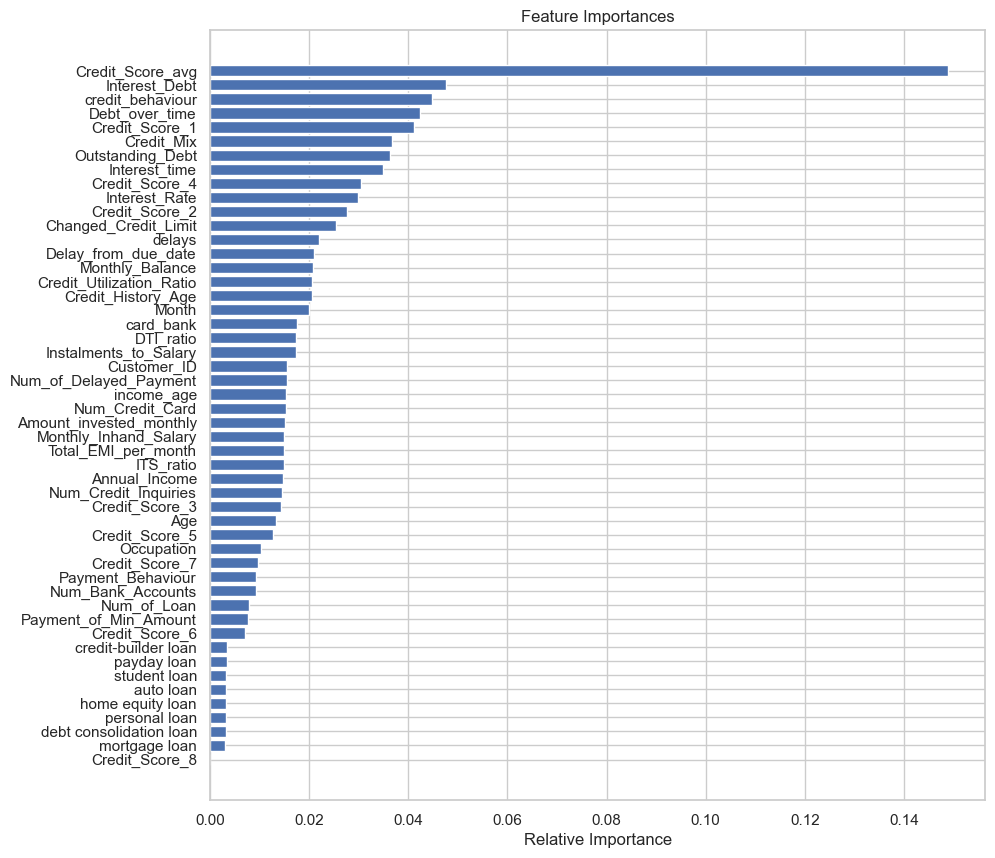

In [ ]:
RF.fit(X_train, y_train)
# plot and print the important features
features = X_train.columns
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
print(X_train.columns[np.argsort(model.feature_importances_)[::-1]])
print(X_train.columns[model.feature_importances_ > 0.01])

Index(['Credit_Score_avg', 'Interest_Debt', 'credit_behaviour',
       'Debt_over_time', 'Credit_Score_1', 'Credit_Mix', 'Outstanding_Debt',
       'Interest_time', 'Credit_Score_4', 'Interest_Rate', 'Credit_Score_2',
       'Changed_Credit_Limit', 'delays', 'Delay_from_due_date',
       'Monthly_Balance', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Month', 'card_bank', 'DTI_ratio', 'Instalments_to_Salary',
       'Customer_ID', 'Num_of_Delayed_Payment', 'income_age',
       'Num_Credit_Card', 'Amount_invested_monthly', 'Monthly_Inhand_Salary',
       'Total_EMI_per_month', 'ITS_ratio', 'Annual_Income',
       'Num_Credit_Inquiries', 'Credit_Score_3', 'Age', 'Credit_Score_5',
       'Occupation', 'Credit_Score_7', 'Payment_Behaviour',
       'Num_Bank_Accounts', 'Num_of_Loan', 'Payment_of_Min_Amount',
       'Credit_Score_6', 'credit-builder loan', 'payday loan', 'student loan',
       'auto loan', 'home equity loan', 'personal loan',
       'debt consolidation loan', 'mo

In [ ]:
selected_cols = ['Credit_Score_avg', 'Interest_Debt', 'credit_behaviour',
       'Debt_over_time', 'Credit_Score_1', 'Credit_Mix', 'Outstanding_Debt',
       'Interest_time', 'Credit_Score_4', 'Interest_Rate', 'Credit_Score_2',
       'Changed_Credit_Limit', 'delays', 'Delay_from_due_date',
       'Monthly_Balance', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Month', 'card_bank', 'DTI_ratio', 'Instalments_to_Salary',
       'Customer_ID', 'Num_of_Delayed_Payment', 'income_age',
       'Num_Credit_Card', 'Amount_invested_monthly', 'Monthly_Inhand_Salary',
       'Total_EMI_per_month', 'ITS_ratio', 'Annual_Income',
       'Num_Credit_Inquiries', 'Credit_Score_3', 'Age', 'Credit_Score_5',
       'Occupation', 'Credit_Score_7', 'Payment_Behaviour',
       'Num_Bank_Accounts', 'Num_of_Loan', 'Payment_of_Min_Amount']
X_train_selected = X_train[selected_cols]

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF, X_train_selected, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest {scores.mean()}')

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(lgb, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for LightGBM{scores.mean()}')

These are the cross validation scores 0.8221714285714287


Here, the accuracy decreased dropping a few features with low importance. We try dropping more features and see how it impacts the model

In [ ]:
selected_cols = ['Credit_Score_avg', 'Interest_Debt', 'credit_behaviour',
       'Debt_over_time', 'Credit_Score_1', 'Credit_Mix', 'Outstanding_Debt',
       'Interest_time', 'Credit_Score_4', 'Interest_Rate', 'Credit_Score_2',
       'Changed_Credit_Limit', 'delays', 'Delay_from_due_date',
       'Monthly_Balance', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Month', 'card_bank', 'DTI_ratio', 'Instalments_to_Salary',
       'Customer_ID', 'Num_of_Delayed_Payment', 'income_age',
       'Num_Credit_Card', 'Amount_invested_monthly', 'Monthly_Inhand_Salary',
       'Total_EMI_per_month', 'ITS_ratio', 'Annual_Income',
       'Num_Credit_Inquiries', 'Credit_Score_3', 'Age']
X_train_selected = X_train[selected_cols]

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF, X_train_selected, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest {scores.mean()}')

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(lgb, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for LightGBM{scores.mean()}')

These are the cross validation scores 0.8195142857142856


We see that accuracy keeps decreasing, hence we decide to keep these new features

Now, we try dimensionality reduction and see if we can keep the variability of our model while reducing the number of components
(Using PCA)

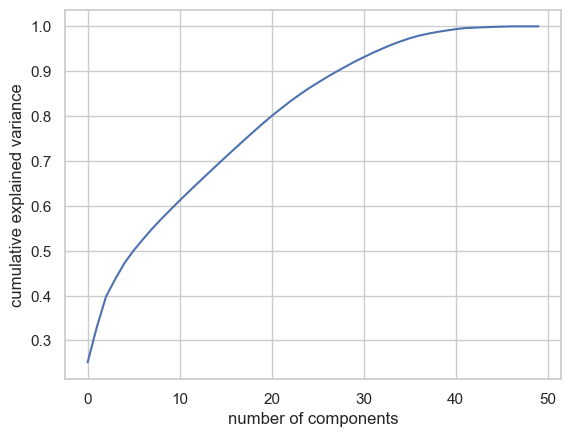

None

,Cumulative Variance Ratio,Explained Variance Ratio
0,0.251150,2.511500e-01
1,0.329707,7.855726e-02
2,0.397850,6.814244e-02
3,0.436686,3.883669e-02
4,0.472289,3.560216e-02
5,0.500486,2.819732e-02
6,0.525062,2.457645e-02
7,0.548833,2.377038e-02
8,0.570569,2.173597e-02
9,0.591322,2.075341e-02


In [ ]:
import numpy as np
#PCA
pca = PCA(n_components=50)
pca.fit(X_train)
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca_test.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
#plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())
evr = pca_test.explained_variance_ratio_
cvr = np.cumsum(pca_test.explained_variance_ratio_)
pca_df = pd.DataFrame()
pca_df['Cumulative Variance Ratio'] = cvr
pca_df['Explained Variance Ratio'] = evr
display(pca_df)


We also try using Singular Value Decomposition : 

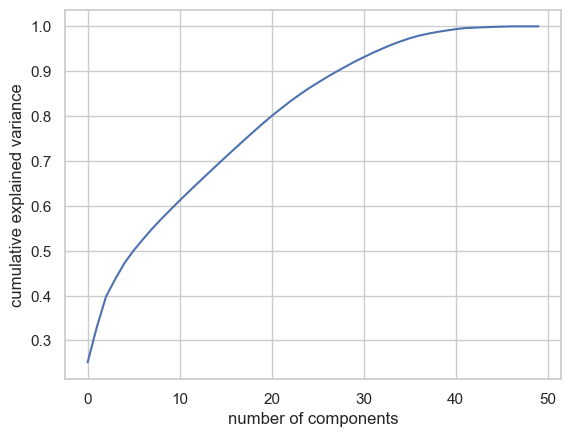

None

,Cumulative Variance Ratio,Explained Variance Ratio
0,0.251150,2.511500e-01
1,0.329707,7.855726e-02
2,0.397850,6.814244e-02
3,0.436686,3.883669e-02
4,0.472289,3.560216e-02
5,0.500486,2.819732e-02
6,0.525062,2.457645e-02
7,0.548833,2.377038e-02
8,0.570569,2.173597e-02
9,0.591322,2.075341e-02


In [ ]:
# Dimensionality reduction using SVD
# plot the explained variance ratio
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50)
svd.fit(X_train)
sns.set(style='whitegrid')
plt.plot(np.cumsum(svd.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
#plt.axvline(linewidth=4, color='r', linestyle = '--', x=10, ymin=0, ymax=1)
display(plt.show())
evr = svd.explained_variance_ratio_
cvr = np.cumsum(svd.explained_variance_ratio_)
svd_df = pd.DataFrame()
svd_df['Cumulative Variance Ratio'] = cvr
svd_df['Explained Variance Ratio'] = evr
display(svd_df)



With SVD, we saw that we got almost exactly the same results as PCA. For that reason, we just try to reduce the number of components to 39, which will keep a little over 99% of our variance, and we see if it improves our model in cross validation

In [ ]:
# fit transform using PCA
pca = PCA(n_components=39)
pca.fit(X_train)
pca_train = pca.transform(X_train)
pca_test = pca.transform(X_test)

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF, pca_train, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest {scores.mean()}')

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(lgb, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for LightGBM {scores.mean()}')

These are the cross validation scores 0.7884571428571429


In [ ]:
# fit transform using PCA
svd = TruncatedSVD(n_components=39)
svd.fit(X_train)
svd_train = svd.transform(X_train)
svd_test = svd.transform(X_test)

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF, pca_train, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest {scores.mean()}')

kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(lgb, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for LightGBM {scores.mean()}')

These are the cross validation scores 0.7884571428571429


Here, we see that dimensionality reduction techniques are not useful as they significantly decrease the accuracy of our model, without reducing much the number of components

# Parameter Tuning

Now that we have added new features, we try to tune the parameters of both Random Forest and Light GBM

Tuning Random Forest:

In [ ]:
#Randomized search to add to optimize hyperparameter
kfold = StratifiedKFold(n_splits=2, random_state=42, shuffle = True)
model = RandomForestClassifier(random_state=0)

space = dict()
space['criterion'] = ['gini', 'log_loss']
space['n_estimators'] = [int(x) for x in np.linspace(start = 800, stop = 1300, num = 50)]
space['max_features'] = ['sqrt', 8, 9]
space['max_depth']= [30, 50, 80]
space['min_samples_split'] : [2, 5]

search = RandomizedSearchCV(model, space, scoring = 'accuracy', n_iter= 50,cv = kfold, refit = True)
result = search.fit(X_train, y_train)

# Obtain the best parameters
best_params = result.best_params_
print("Best Parameters:", best_params)



In [ ]:
rs_df = pd.DataFrame(result.cv_results_).sort_values('rank_test_score').reset_index(drop=True)
rs_df = rs_df.drop([
            'mean_fit_time', 
            'std_fit_time', 
            'mean_score_time',
            'std_score_time', 
            'params', 
            'split0_test_score', 
            'split1_test_score', 
            'std_test_score'],
            axis=1)
rs_df.head(10)

In [ ]:
fig, axs = plt.subplots(ncols=3, nrows=1)
sns.set(style="whitegrid", color_codes=True, font_scale = 2)
fig.set_size_inches(30,10)

sns.barplot(x='param_n_estimators', y='mean_test_score', data=rs_df, ax=axs[0], color='lightgrey')

axs[0].set_title(label = 'n_estimators', size=30, weight='bold')

sns.barplot(x='param_max_features', y='mean_test_score', data=rs_df, ax=axs[1], color='coral')

axs[1].set_title(label = 'max_features', size=30, weight='bold')

sns.barplot(x='param_max_depth', y='mean_test_score', data=rs_df, ax=axs[2], color='lightgreen')

axs[2].set_title(label = 'max_depth', size=30, weight='bold')

plt.show()

In [ ]:
RF_tuned = RandomForestClassifier(n_estimators = 800, criterion = 'log_loss', max_features = 7, n_jobs=-1 )
kfold = StratifiedKFold(n_splits=5, random_state=42, shuffle = True)
scores = cross_val_score(RF_tuned, X_train, y_train, cv=kfold)
print(f'These are the cross validation scores for Random Forest {scores.mean()}')

These are the cross validation scores for Random Forest 0.8251142857142858


Tuning LightGBM:

# Submission 

In [ ]:
model = make_pipeline(RandomForestClassifier(criterion= 'log_loss',random_state=0, n_estimators= 1000, max_features = 8, n_jobs=-1))
model.fit(X_train, y_train)

Pipeline(steps=[('randomforestclassifier',
                 RandomForestClassifier(criterion='log_loss', max_features=8,
                                        n_estimators=1000, n_jobs=-1,
                                        random_state=0))])

In [ ]:
def generate_submission(X_test):
    list_of_predictions = model.predict(X_test)
    label_map = {0: 'Good', 1: 'Standard', 2: 'Poor'}

# Replace numeric values with corresponding labels using the map
    mapped_labels = [label_map[val] for val in list_of_predictions]
    df = pd.DataFrame({'Credit_Score': mapped_labels}, index=X_test.index)
    df.to_csv('/Users/jojolapatate/Documents/M2 ESSEC CENTRALE/FML/Assignment2/sandbox_submission.csv')

generate_submission(X_test)